<a href="https://colab.research.google.com/github/pankaj18/GAN_specialization_coursera/blob/main/Gan_implementations/Vannila_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import torch
import torch.nn as nn
from torchvision.utils import save_image,make_grid
from torch.autograd import Variable
import torchvision 
from torchvision import transforms
from torch.utils.data import DataLoader,Dataset

In [5]:
import argparse
parser=argparse.ArgumentParser()
parser.add_argument("--n_epochs", type=int, default=200, help="number of epochs of training")
parser.add_argument("--batch_size", type=int, default=128, help="size of the batches")
parser.add_argument("--lr", type=float, default=2e-4, help="adam:learning rate")
parser.add_argument("--b1", type=float, default=0.5, help="adam:decay of first order momentum of gradient")
parser.add_argument("--b2", type=float, default=0.999, help="adam:decay of second order momentum of gradient")
parser.add_argument("--latent_dim", type=int, default=100, help="dimension of latent space(generators's output)")
parser.add_argument("--img_size", type=int, default=28, help="image size")
parser.add_argument("--channels", type=int, default=1, help="number of channels")


_StoreAction(option_strings=['--channels'], dest='channels', nargs=None, const=None, default=1, type=<class 'int'>, choices=None, help='number of channels', metavar=None)

In [6]:
args=parser.parse_args(args=[])

In [7]:
train_transforms=transforms.Compose([
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean=(0.5),std=(0.5))
])

In [8]:
data=torchvision.datasets.FashionMNIST('./data',train=True,download=True,transform=train_transforms)


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw




Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw




Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw




Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [9]:
ls data/FashionMNIST/raw

t10k-images-idx3-ubyte     train-images-idx3-ubyte
t10k-images-idx3-ubyte.gz  train-images-idx3-ubyte.gz
t10k-labels-idx1-ubyte     train-labels-idx1-ubyte
t10k-labels-idx1-ubyte.gz  train-labels-idx1-ubyte.gz


In [10]:
train_loader=DataLoader(data,batch_size=args.batch_size,shuffle=True)

In [11]:
#next(iter(train_loader))

Generator

In [12]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator,self).__init__()
    self.model=nn.Sequential(
        nn.Linear(100,128),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Linear(128,256),
        nn.BatchNorm1d(256,0.8),
        nn.LeakyReLU(0.2,inplace=True),
        
        nn.Linear(256,512),
        nn.BatchNorm1d(512,0.8),
        nn.LeakyReLU(0.2,inplace=True),
        
        nn.Linear(512,1024),
        nn.BatchNorm1d(1024,0.8),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Linear(1024,784),
        nn.Tanh()
    )
  def forward(self,noise_vector):
    image=self.model(noise_vector)
    image=image.view(image.size(0),1,28,28)
    return image


Discriminator

In [13]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator,self).__init__()
    self.model=nn.Sequential(
        nn.Linear(784,512),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Linear(512,256),
        nn.LeakyReLU(0.2,inplace=True),

        nn.Linear(256,1),
        nn.Sigmoid()
    )
  def forward(self,image):
    image_flattened=image.view(image.size(0),-1)
    result=self.model(image_flattened)
    return result

In [14]:
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
generator=Generator().to(device)
discriminator=Discriminator().to(device)

In [15]:
adversial_loss=nn.BCELoss()
G_opt=torch.optim.Adam(generator.parameters(),lr=args.lr,betas=(args.b1,args.b2))
D_opt=torch.optim.Adam(discriminator.parameters(),lr=args.lr,betas=(args.b1,args.b2))

Training Networks

epoch:1


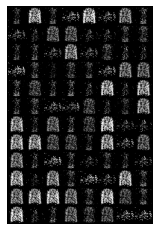

epoch:2


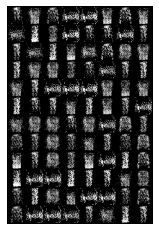

epoch:3


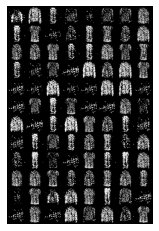

epoch:4


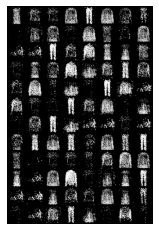

epoch:5


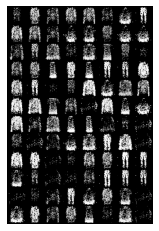

epoch:6


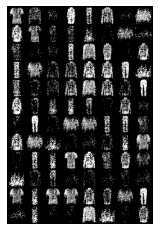

epoch:7


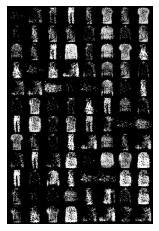

epoch:8


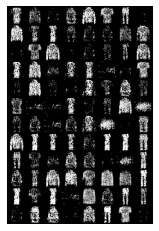

epoch:9


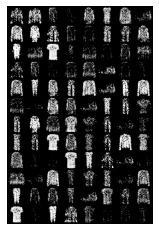

epoch:10


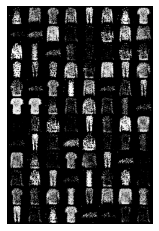

epoch:11


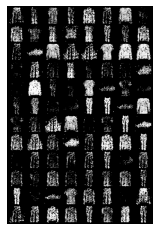

epoch:12


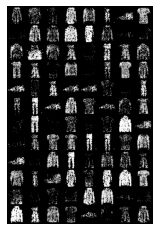

epoch:13


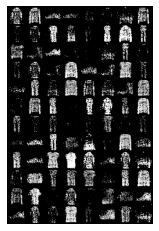

epoch:14


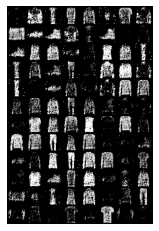

epoch:15


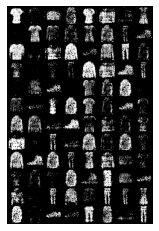

epoch:16


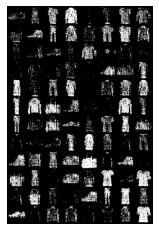

epoch:17


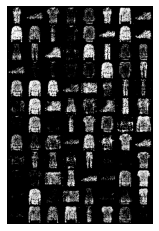

epoch:18


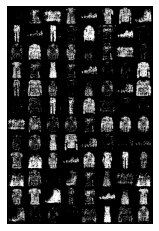

epoch:19


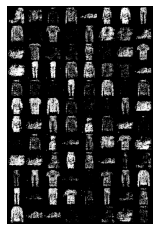

epoch:20


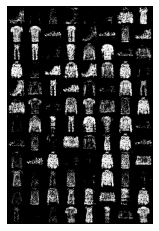

epoch:21


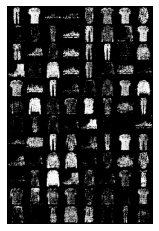

epoch:22


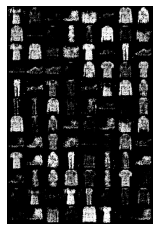

epoch:23


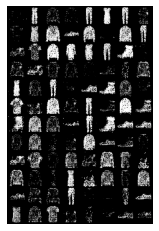

epoch:24


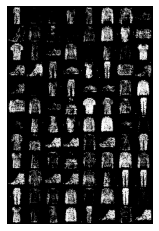

epoch:25


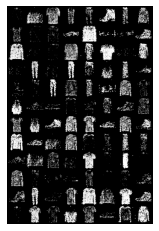

epoch:26


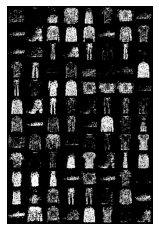

epoch:27


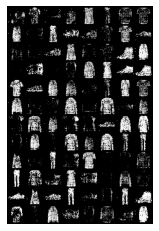

epoch:28


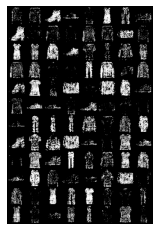

epoch:29


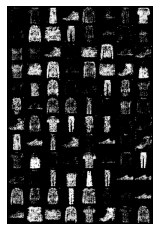

epoch:30


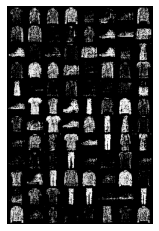

epoch:31


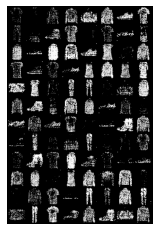

epoch:32


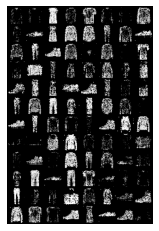

epoch:33


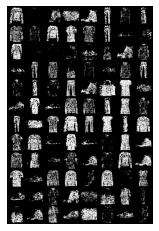

epoch:34


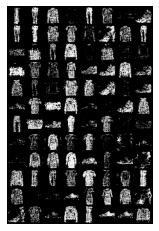

epoch:35


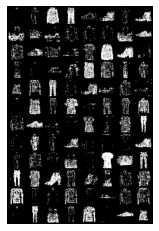

epoch:36


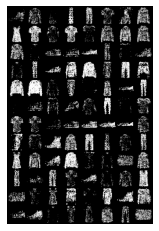

epoch:37


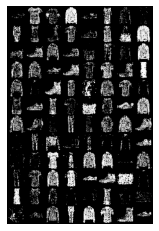

epoch:38


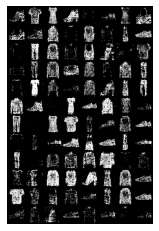

epoch:39


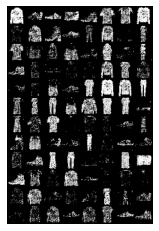

epoch:40


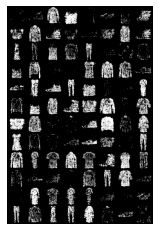

epoch:41


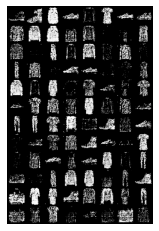

epoch:42


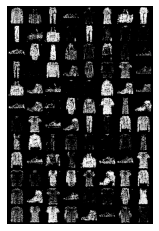

epoch:43


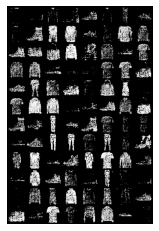

epoch:44


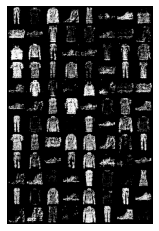

epoch:45


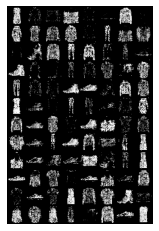

epoch:46


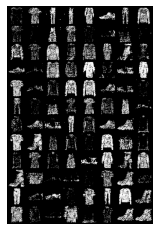

epoch:47


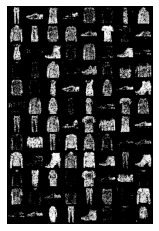

epoch:48


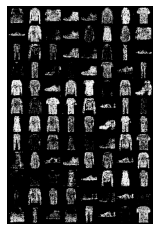

epoch:49


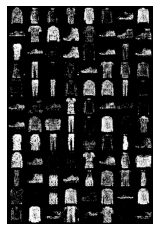

epoch:50


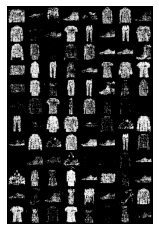

epoch:51


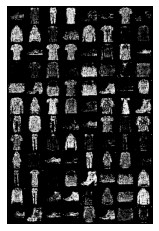

epoch:52


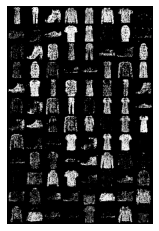

epoch:53


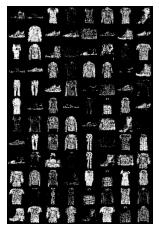

epoch:54


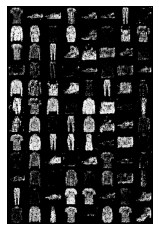

epoch:55


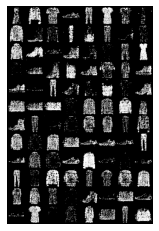

epoch:56


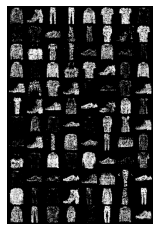

epoch:57


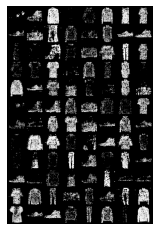

epoch:58


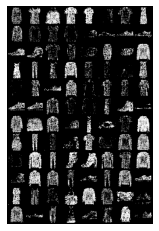

epoch:59


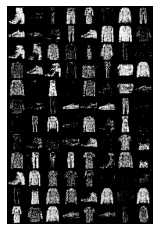

epoch:60


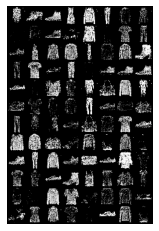

epoch:61


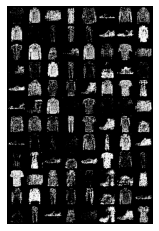

epoch:62


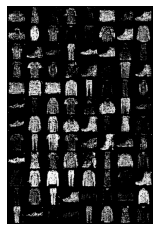

epoch:63


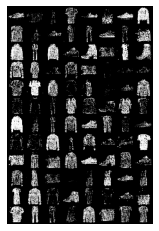

epoch:64


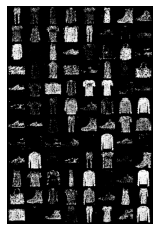

epoch:65


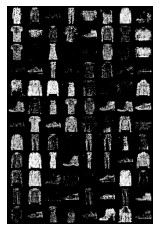

epoch:66


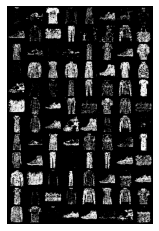

epoch:67


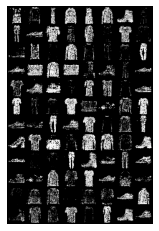

epoch:68


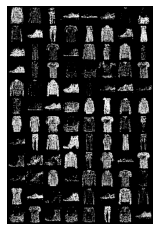

epoch:69


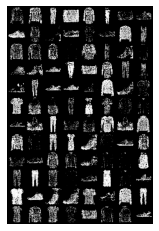

epoch:70


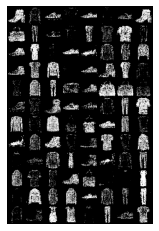

epoch:71


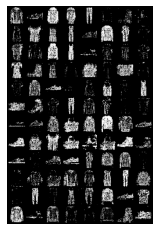

epoch:72


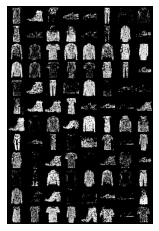

epoch:73


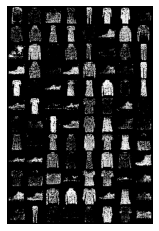

epoch:74


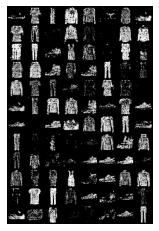

epoch:75


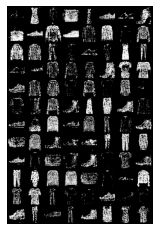

epoch:76


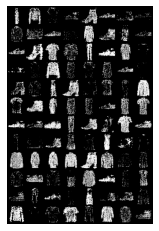

epoch:77


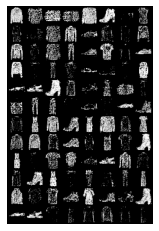

epoch:78


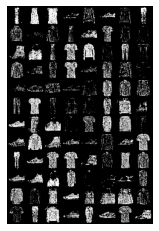

epoch:79


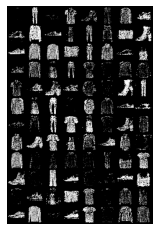

epoch:80


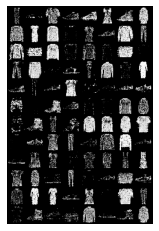

epoch:81


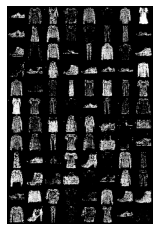

epoch:82


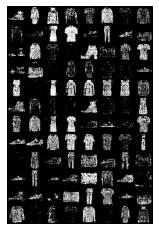

epoch:83


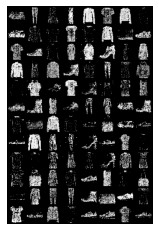

epoch:84


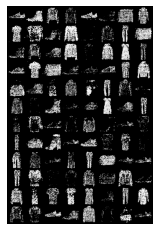

epoch:85


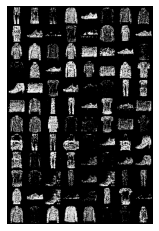

epoch:86


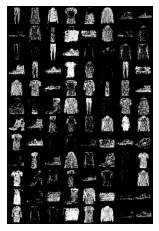

epoch:87


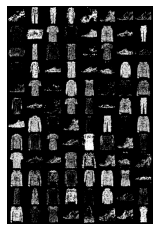

epoch:88


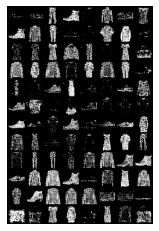

epoch:89


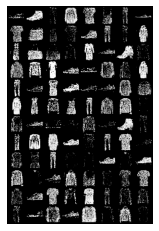

epoch:90


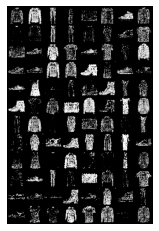

epoch:91


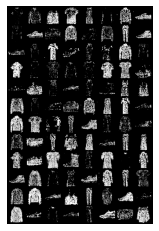

epoch:92


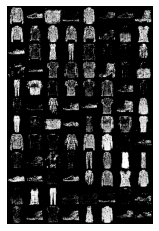

epoch:93


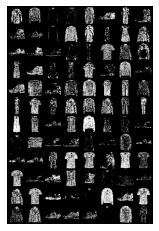

epoch:94


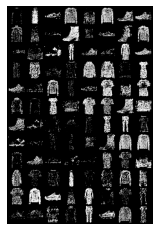

epoch:95


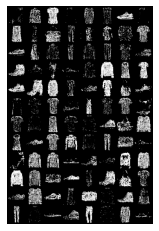

epoch:96


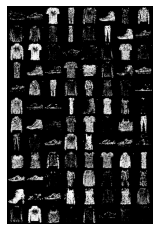

epoch:97


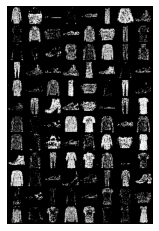

epoch:98


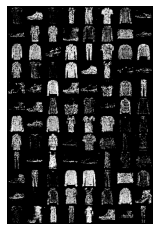

epoch:99


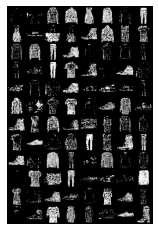

epoch:100


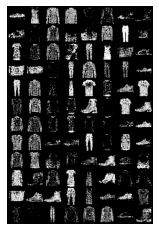

epoch:101


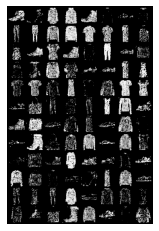

epoch:102


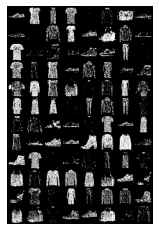

epoch:103


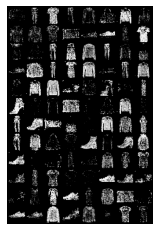

epoch:104


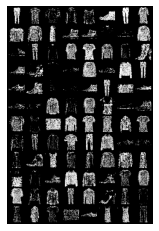

epoch:105


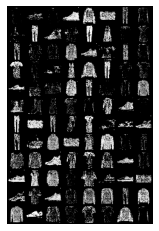

epoch:106


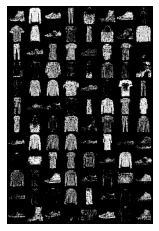

epoch:107


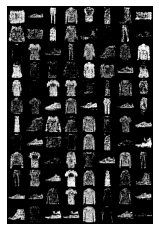

epoch:108


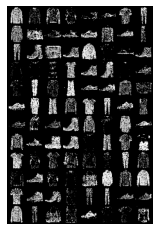

epoch:109


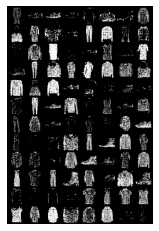

epoch:110


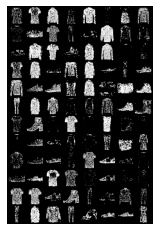

epoch:111


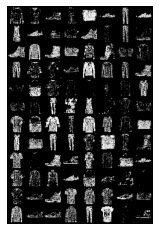

epoch:112


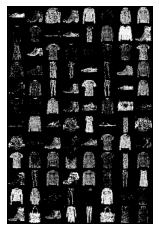

epoch:113


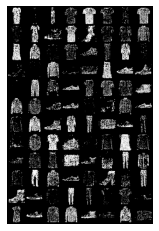

epoch:114


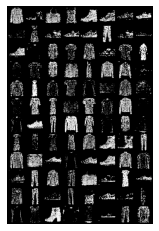

epoch:115


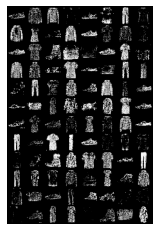

epoch:116


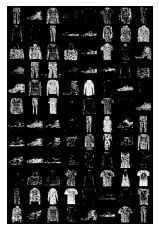

epoch:117


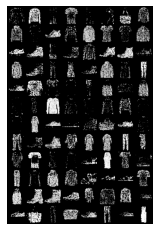

epoch:118


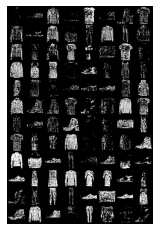

epoch:119


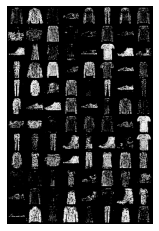

epoch:120


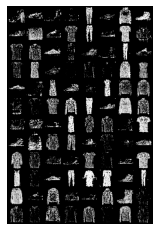

epoch:121


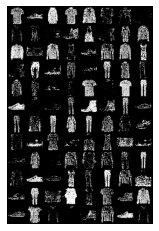

epoch:122


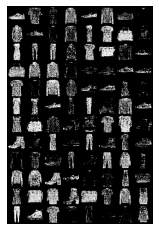

epoch:123


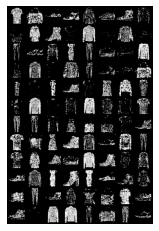

epoch:124


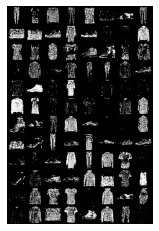

epoch:125


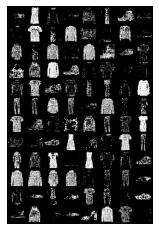

epoch:126


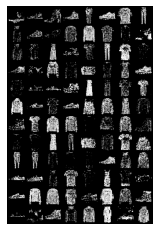

epoch:127


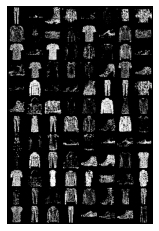

epoch:128


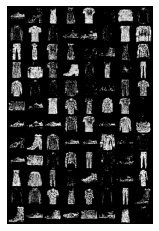

epoch:129


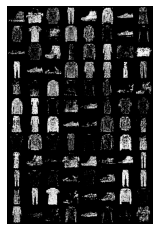

epoch:130


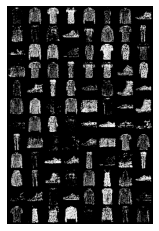

epoch:131


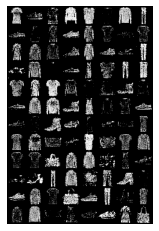

epoch:132


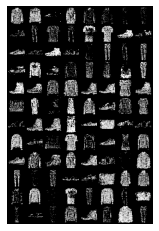

epoch:133


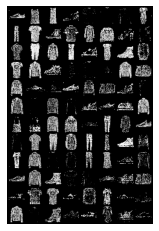

epoch:134


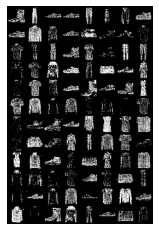

epoch:135


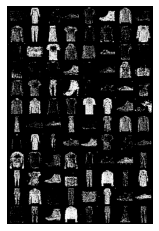

epoch:136


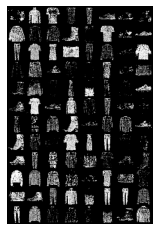

epoch:137


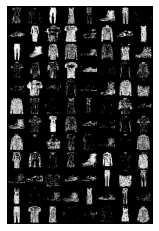

epoch:138


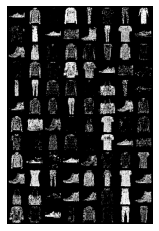

epoch:139


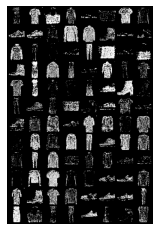

epoch:140


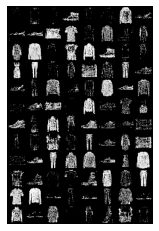

epoch:141


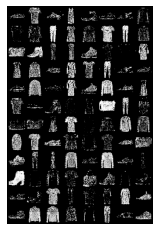

epoch:142


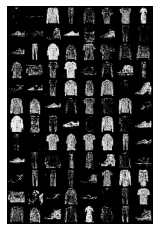

epoch:143


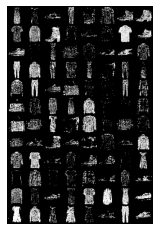

epoch:144


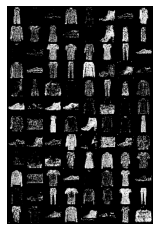

epoch:145


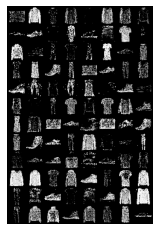

epoch:146


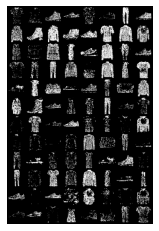

epoch:147


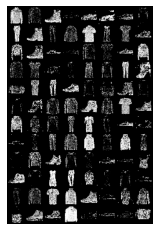

epoch:148


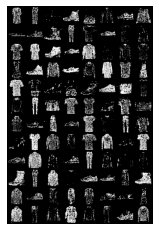

epoch:149


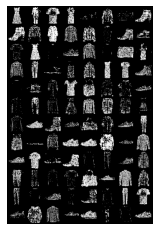

epoch:150


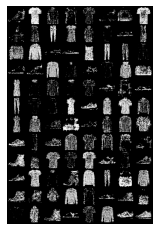

epoch:151


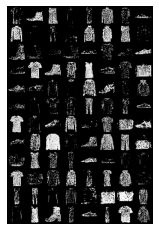

epoch:152


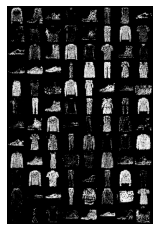

epoch:153


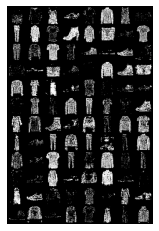

epoch:154


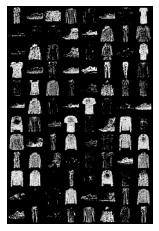

epoch:155


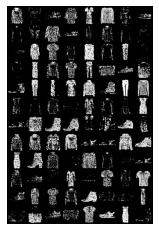

epoch:156


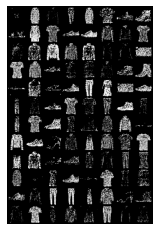

epoch:157


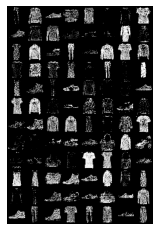

epoch:158


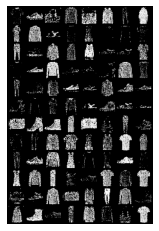

epoch:159


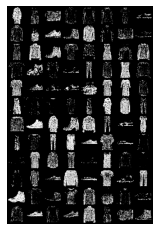

epoch:160


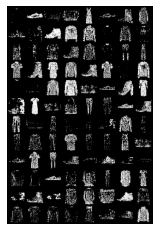

epoch:161


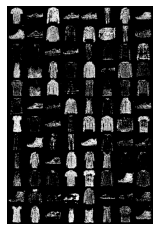

epoch:162


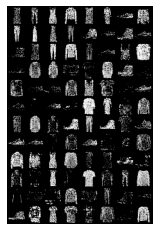

epoch:163


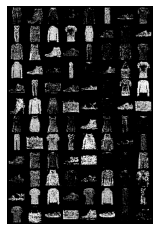

epoch:164


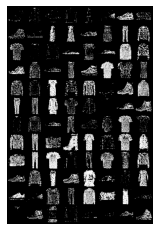

epoch:165


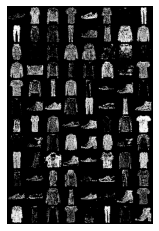

epoch:166


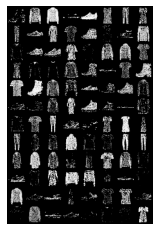

epoch:167


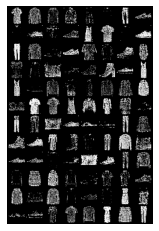

epoch:168


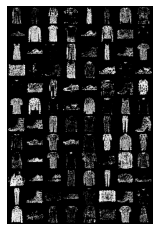

epoch:169


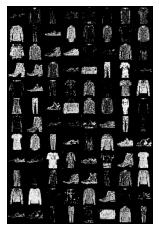

epoch:170


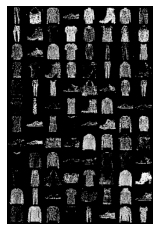

epoch:171


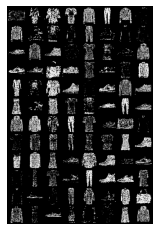

epoch:172


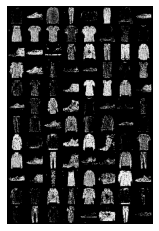

epoch:173


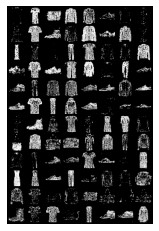

epoch:174


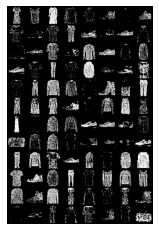

epoch:175


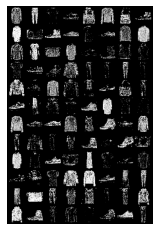

epoch:176


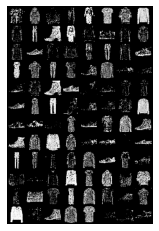

epoch:177


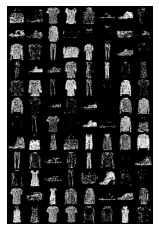

epoch:178


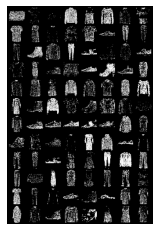

epoch:179


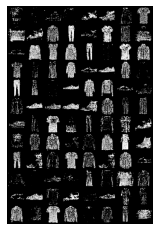

epoch:180


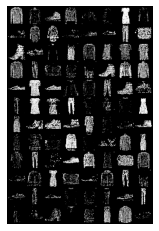

epoch:181


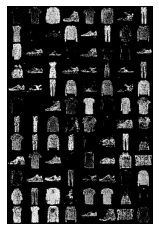

epoch:182


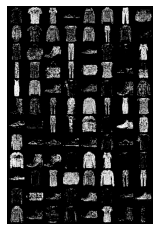

epoch:183


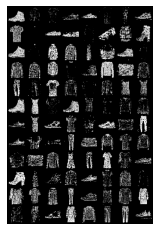

epoch:184


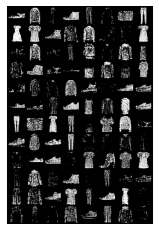

epoch:185


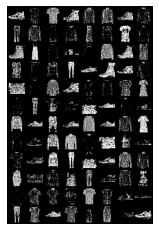

epoch:186


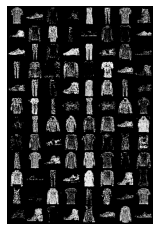

epoch:187


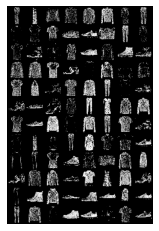

epoch:188


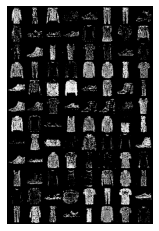

epoch:189


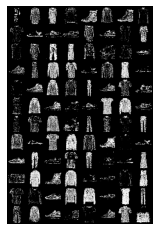

epoch:190


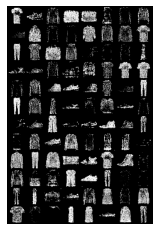

epoch:191


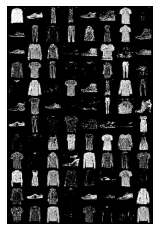

epoch:192


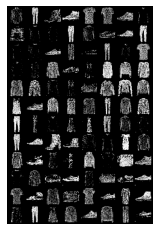

epoch:193


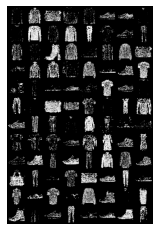

epoch:194


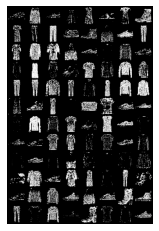

epoch:195


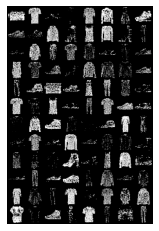

epoch:196


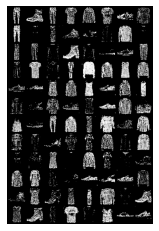

epoch:197


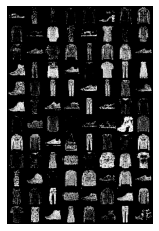

epoch:198


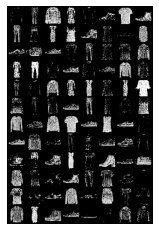

epoch:199


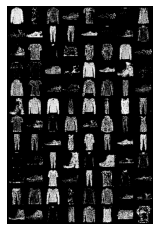

epoch:200


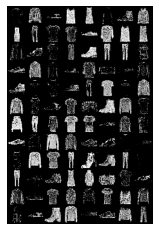

In [16]:
for epoch in range(1,args.n_epochs+1):
  D_loss_list,G_loss_list=[],[]
  print(f"epoch:{epoch}")
  for index, (real_images,_) in enumerate(train_loader):
    real_images=real_images.to(device)

    real_labels=Variable(torch.ones(real_images.size(0),1)).to(device)
    fake_labels=Variable(torch.zeros(real_images.size(0),1)).to(device)
    # training discriminator on real data
    #print(real_images.size())
    #print(real_images.view(real_images.size(0),-1))
    #print(discriminator(real_images))
    D_real_loss=adversial_loss(discriminator(real_images),real_labels)
    # noise vector sampled from normal distribution
    noise_vector=Variable(torch.randn(real_images.size(0),args.latent_dim)).to(device)
    generated_images=generator(noise_vector)
    # training discriminator on fake data
    D_fake_loss=adversial_loss(discriminator(generated_images),fake_labels)
    D_total_loss=D_real_loss+D_fake_loss
    D_loss_list.append(D_total_loss)
    D_opt.zero_grad()
    D_total_loss.backward()
    D_opt.step()

    # train Generator on discriminator output
    G_opt.zero_grad()
    generated_images = generator(noise_vector)
    G_loss=adversial_loss(discriminator(generated_images),real_labels)
    G_loss_list.append(G_loss)
    G_loss.backward()
    G_opt.step()
  grid_img = torchvision.utils.make_grid(generated_images, nrow=8).cpu().numpy().transpose((1,2,0))
  grid_img = np.clip(grid_img,0,1)
  plt.imshow(grid_img)
  plt.axis("off")
  plt.pause(0.001)

  


  
